<a href="https://colab.research.google.com/github/bharathraj-v/geoml-wd/blob/main/notebooks/bdappv_fasterRCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pycocotools --quiet
!git clone https://github.com/pytorch/vision.git
!git checkout v0.3.0

!cp vision/references/detection/utils.py ./
!cp vision/references/detection/transforms.py ./
!cp vision/references/detection/coco_eval.py ./
!cp vision/references/detection/engine.py ./
!cp vision/references/detection/coco_utils.py ./

Cloning into 'vision'...
remote: Enumerating objects: 323071, done.
remote: Counting objects: 100% (1042/1042), done.
remote: Compressing objects: 100% (281/281), done.
remote: Total 323071 (delta 799), reused 976 (delta 752), pack-reused 322029
Receiving objects: 100% (323071/323071), 655.35 MiB | 21.39 MiB/s, done.
Resolving deltas: 100% (296868/296868), done.
fatal: not a git repository (or any of the parent directories): .git


In [2]:
# Basic python and ML Libraries
import os
import random
import numpy as np
import pandas as pd
# for ignoring warnings
import warnings
warnings.filterwarnings('ignore')

# We will be reading images using OpenCV
import cv2

# xml library for parsing xml files
from xml.etree import ElementTree as et

# matplotlib for visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# torchvision libraries
import torch
import torchvision
from torchvision import transforms as torchtrans  
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# these are the helper libraries imported.
from engine import train_one_epoch, evaluate
import utils
import transforms as T

# for image augmentations
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
%%capture
!cp /content/drive/MyDrive/bdappv.zip /content/
!unzip bdappv.zip

In [5]:
images_path = "/content/bdappv/google/img"
mask_path = "/content/bdappv/google/mask"

images = []
masks = []

for root, dirs, files in os.walk(images_path):
    for file in files:
        images.append(os.path.join(root, file))

for root, dirs, files in os.walk(mask_path):
    for file in files:
        masks.append(os.path.join(root, file))


In [6]:
images[:10]

['/content/bdappv/google/img/MRBRZ7A4CPBITO.png',
 '/content/bdappv/google/img/GLRML348EJGCGQ.png',
 '/content/bdappv/google/img/KXVPK6408OPBWW.png',
 '/content/bdappv/google/img/DSHJH52CFKLQTO.png',
 '/content/bdappv/google/img/ZYSIS18B1TTQEB.png',
 '/content/bdappv/google/img/LBQMM520FQGSOC.png',
 '/content/bdappv/google/img/CCKWH285SURAJ.png',
 '/content/bdappv/google/img/IVRGJ109BRGENB.png',
 '/content/bdappv/google/img/JGCLG5998HDKAI.png',
 '/content/bdappv/google/img/BEUUM2E2EMGKWG.png']

In [7]:
masks[:10]

['/content/bdappv/google/mask/ZYSIS18B1TTQEB.png',
 '/content/bdappv/google/mask/LBQMM520FQGSOC.png',
 '/content/bdappv/google/mask/CCKWH285SURAJ.png',
 '/content/bdappv/google/mask/YEGRP2F74XFKEY.png',
 '/content/bdappv/google/mask/DCLRI54F9BQQOG.png',
 '/content/bdappv/google/mask/HZMXP7BE6MDHET.png',
 '/content/bdappv/google/mask/IEMSS243FSQXTB.png',
 '/content/bdappv/google/mask/OJXJL264BLTLYH.png',
 '/content/bdappv/google/mask/XPULG7261OACWU.png',
 '/content/bdappv/google/mask/PTFDF8627TGPKL.png']

In [14]:
images = []
for i in masks:
  images.append(i.replace('mask','img'))

In [24]:
import cv2
import torchvision
from torchvision.utils import draw_bounding_boxes
import imutils
from torchvision.ops import masks_to_boxes
from torchvision.io import read_image

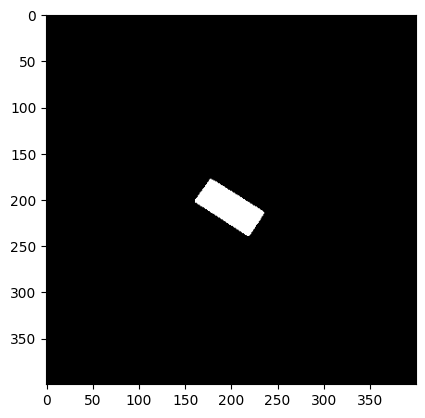

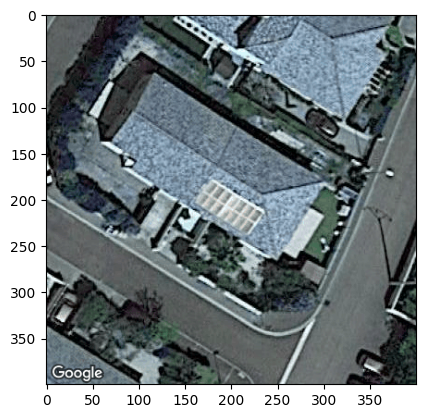

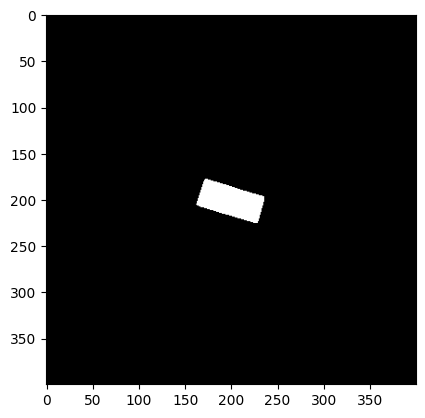

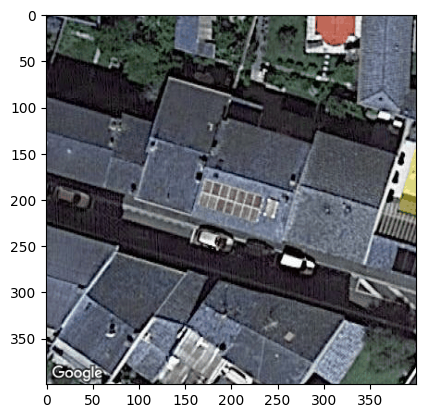

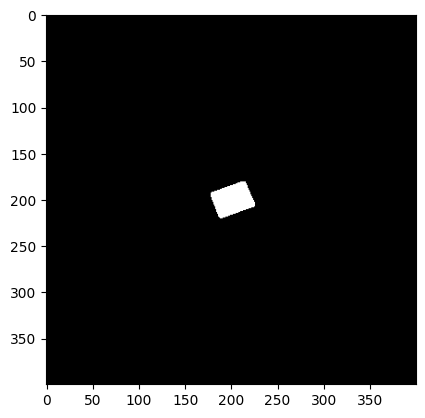

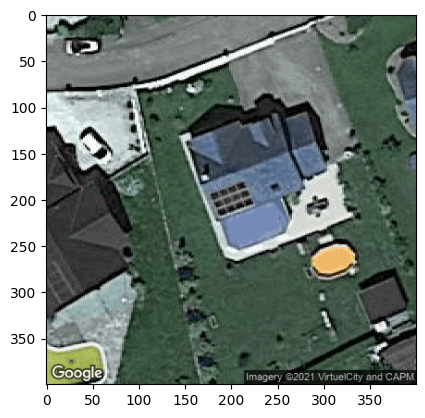

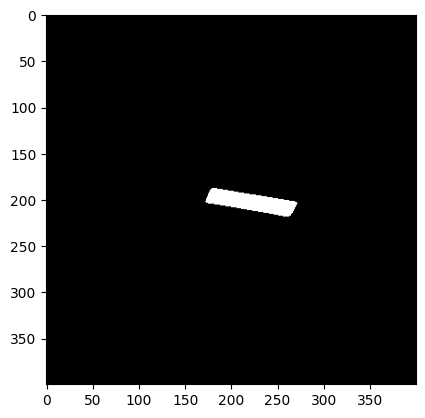

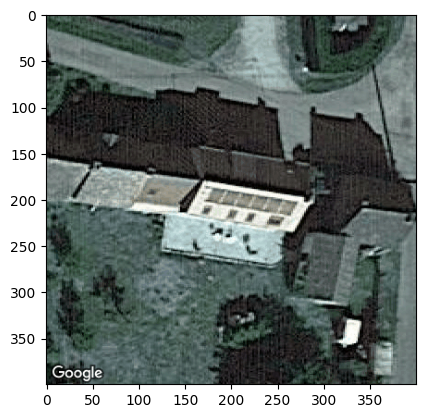

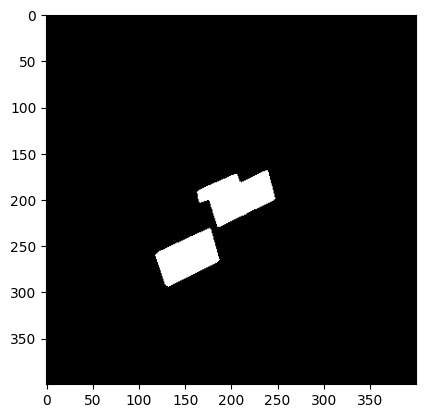

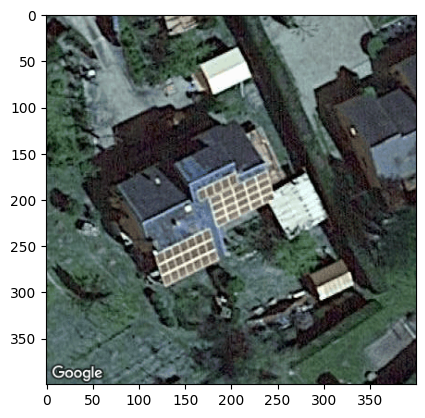

In [18]:
for i in range(5):
  plt.imshow(cv2.imread(masks[i]))
  plt.show()
  plt.imshow(cv2.imread(images[i]))
  plt.show()


In [20]:
img_sample = cv2.imread(images[0])
img_sample.shape

(400, 400, 3)

In [26]:
def get_bbx_from_mask(image_path, mask_path):
    sample_mask = cv2.imread(mask_path)
    gray = cv2.cvtColor(sample_mask, cv2.COLOR_BGR2GRAY)
    contours = cv2.findContours(gray.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(contours)
    bounding_boxes = []
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        bounding_boxes.append([x,y,w,h])
    if len(cnts) == 0:
      bounding_boxes = [[0,0,0,0]]
    bounding_boxes = torch.FloatTensor(bounding_boxes)
    bounding_boxes =  torchvision.ops.box_convert(bounding_boxes, in_fmt="xywh", out_fmt="xyxy")
    drawn_boxes = draw_bounding_boxes(read_image(image_path), bounding_boxes, colors="red")
    return bounding_boxes, drawn_boxes

In [25]:
from PIL import Image


class PanelDataset(torch.utils.data.Dataset):
    def __init__(self, root, width=400, height=400, transforms=None):
        self.root = root
        self.transforms = transforms
        self.height = height
        self.width = width

        self.masks = list(os.listdir(os.path.join(root, "mask")))
        self.imgs = [i.replace('mask', 'img') for i in self.masks]
        # load all image files, sorting them to
        # ensure that they are aligned
        # self.imgs = list(sorted(os.listdir(os.path.join(root, "images")), key=lambda x: int(x.split("/")[-1].split(".")[0])))
        # self.masks = list(sorted(os.listdir(os.path.join(root, "masks")), key=lambda x: int(x.split("/")[-1].split(".")[0])))

    def __getitem__(self, idx):
        # load images and masks
        img_path = os.path.join(self.root, "img", self.imgs[idx])
        mask_path = os.path.join(self.root, "mask", self.masks[idx])

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)

        img_res /= 255.0

        boxes, drawn_boxes = get_bbx_from_mask(img_path, mask_path)


        # there is only one class
        labels = torch.ones((boxes.shape[0],), dtype=torch.int64)
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        target = {}
        target["iscrowd"] = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area

        image_id = torch.tensor([idx])
        target["image_id"] = image_id


        if self.transforms is not None:
             sample = self.transforms(image = img_res,
                                     bboxes = target['boxes'],
                                     labels = labels)
             img_res = sample['image']
             target['boxes'] = torch.Tensor(sample['bboxes'])

        return img_res, target

    def __len__(self):
        return len(self.imgs)

In [27]:
dataset = PanelDataset("/content/bdappv/google")
img, target = dataset[5]
print(img.shape, target)

(400, 400, 3) {'iscrowd': tensor([0]), 'boxes': tensor([[178., 170., 222., 237.]]), 'labels': tensor([1]), 'area': tensor([2948.]), 'image_id': tensor([5])}


In [28]:
len(dataset)

13303

In [29]:
def plot_img_bbox(img, target):
    # plot the image and bboxes
    # Bounding boxes are defined as follows: x-min y-min width height
    fig, a = plt.subplots(1,1)
    fig.set_size_inches(10,10)
    a.imshow(img)
    for box in (target['boxes'].cpu()):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        # Draw the bounding box on top of the image
        a.add_patch(rect)
    plt.show()

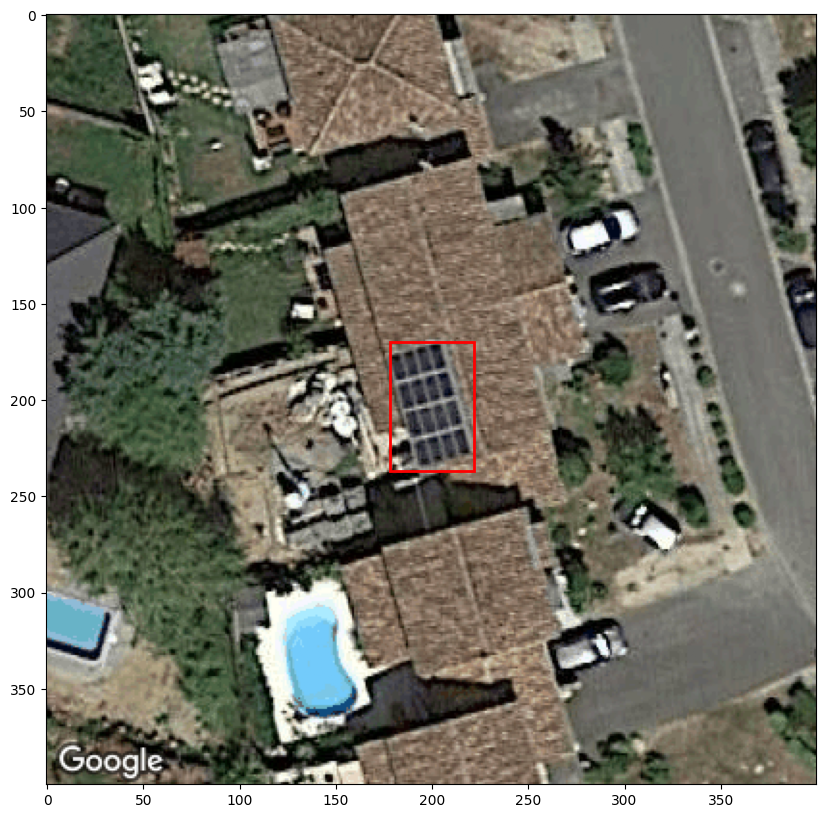

In [31]:
dataset = PanelDataset("/content/bdappv/google")
img, target = dataset[5]

plot_img_bbox(img, target)

### FasterRCNN

In [32]:
def get_object_detection_model(num_classes):

    # load a model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) 

    return model

In [33]:
def get_transform(train):
    if train:
        return A.Compose([
                            ToTensorV2(p=1.0) 
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
  

In [34]:
dataset = PanelDataset("/content/bdappv/google",  transforms= get_transform(train=True))
dataset_test = PanelDataset("/content/bdappv/google",  transforms= get_transform(train=False))


# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()

# train test split
test_split = 0.2
tsize = int(len(dataset)*test_split)
dataset = torch.utils.data.Subset(dataset, indices[:-tsize])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-tsize:])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=10, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=10, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)


In [35]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')


num_classes = 4

# get the model using our helper function
model = get_object_detection_model(num_classes)

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 186MB/s]


In [37]:
num_epochs = 4

for epoch in range(num_epochs):
    # training for one epoch
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)

Epoch: [0]  [   0/1065]  eta: 0:54:53  lr: 0.000002  loss: 0.1114 (0.1114)  loss_classifier: 0.0458 (0.0458)  loss_box_reg: 0.0551 (0.0551)  loss_objectness: 0.0075 (0.0075)  loss_rpn_box_reg: 0.0031 (0.0031)  time: 3.0926  data: 1.2180  max mem: 8392
Epoch: [0]  [  10/1065]  eta: 0:34:24  lr: 0.000013  loss: 0.1180 (0.1176)  loss_classifier: 0.0458 (0.0453)  loss_box_reg: 0.0666 (0.0657)  loss_objectness: 0.0048 (0.0047)  loss_rpn_box_reg: 0.0018 (0.0018)  time: 1.9572  data: 0.1677  max mem: 8394
Epoch: [0]  [  20/1065]  eta: 0:33:02  lr: 0.000023  loss: 0.1187 (0.1270)  loss_classifier: 0.0448 (0.0487)  loss_box_reg: 0.0666 (0.0699)  loss_objectness: 0.0047 (0.0058)  loss_rpn_box_reg: 0.0018 (0.0026)  time: 1.8376  data: 0.0509  max mem: 8395
Epoch: [0]  [  30/1065]  eta: 0:32:25  lr: 0.000034  loss: 0.1213 (0.1266)  loss_classifier: 0.0450 (0.0489)  loss_box_reg: 0.0666 (0.0689)  loss_objectness: 0.0042 (0.0065)  loss_rpn_box_reg: 0.0015 (0.0024)  time: 1.8368  data: 0.0428  max me

In [38]:
def apply_nms(orig_prediction, iou_thresh=0.3):
    
    # torchvision returns the indices of the bboxes to keep
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

# function to convert a torchtensor back to PIL image
def torch_to_pil(img):
    return torchtrans.ToPILImage()(img).convert('RGB')

In [39]:

# pick one image from the test set
img, target = dataset_test[5]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]
    
print('predicted #boxes: ', len(prediction['labels']))
print('real #boxes: ', len(target['labels']))

predicted #boxes:  2
real #boxes:  1


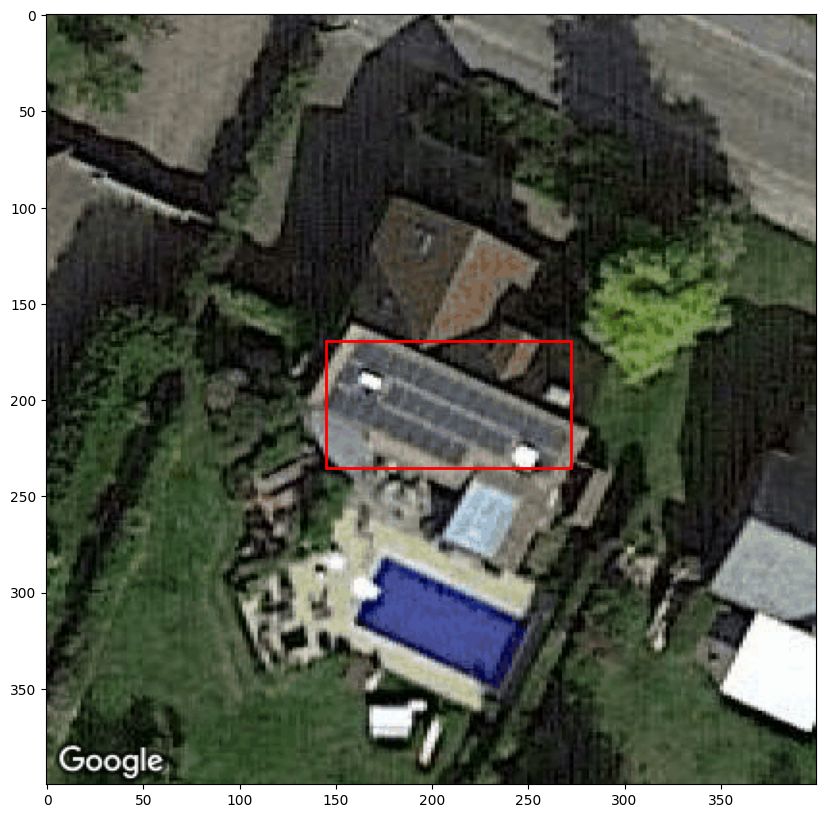

In [40]:
plot_img_bbox(torch_to_pil(img), target)

In [41]:
nms_prediction = apply_nms(prediction, iou_thresh=0.01)
nms_prediction

{'boxes': tensor([[142.2663, 167.4161, 271.6395, 238.3514],
         [161.8893, 284.1566, 245.8689, 347.2657]], device='cuda:0'),
 'labels': tensor([1, 1], device='cuda:0'),
 'scores': tensor([0.9979, 0.1593], device='cuda:0')}

In [42]:
len(nms_prediction['boxes'])

2

Original Bounding Box(s)


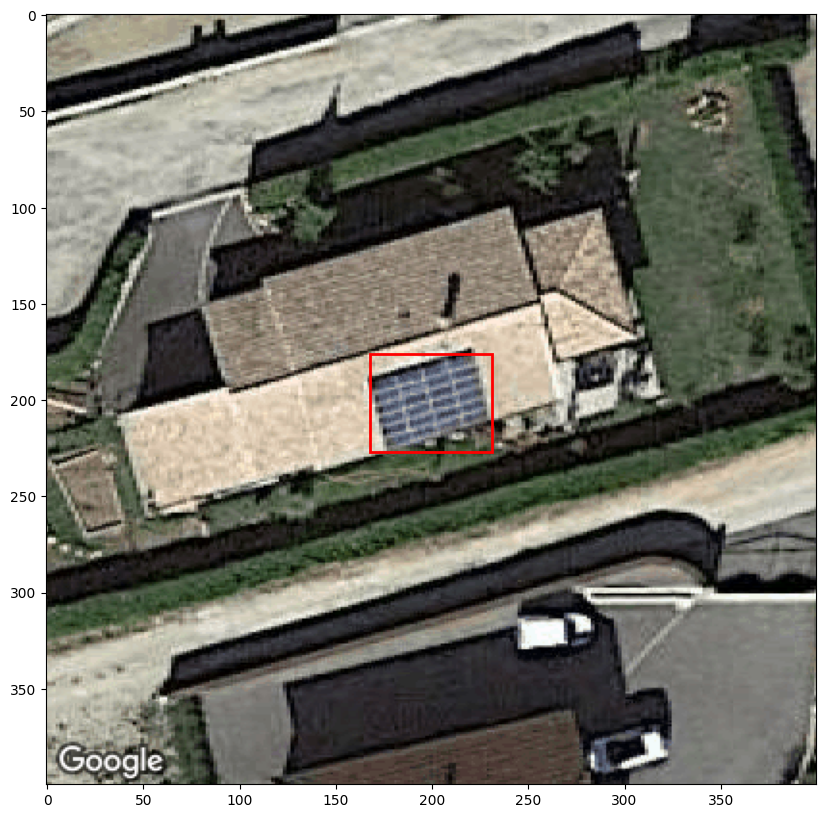

Predicted Bounding Box(s)


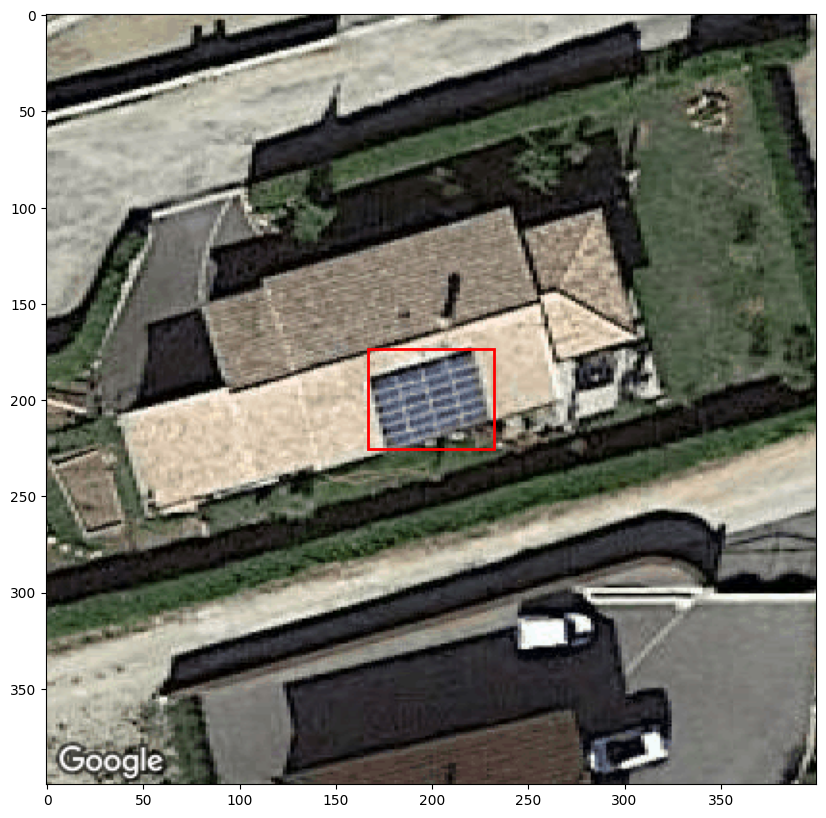

Original Bounding Box(s)


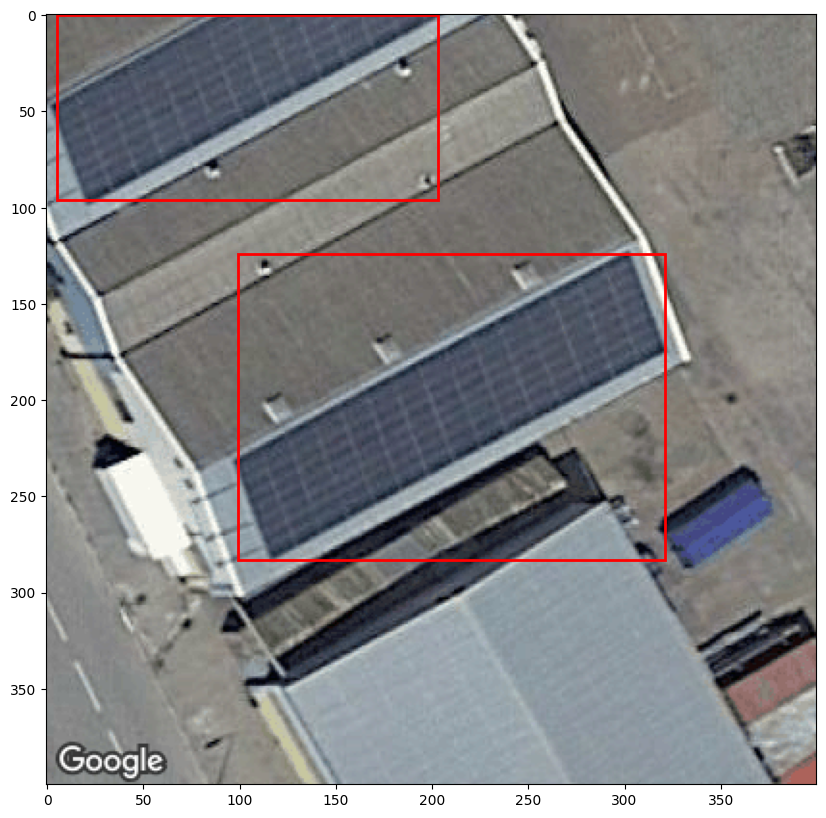

Predicted Bounding Box(s)


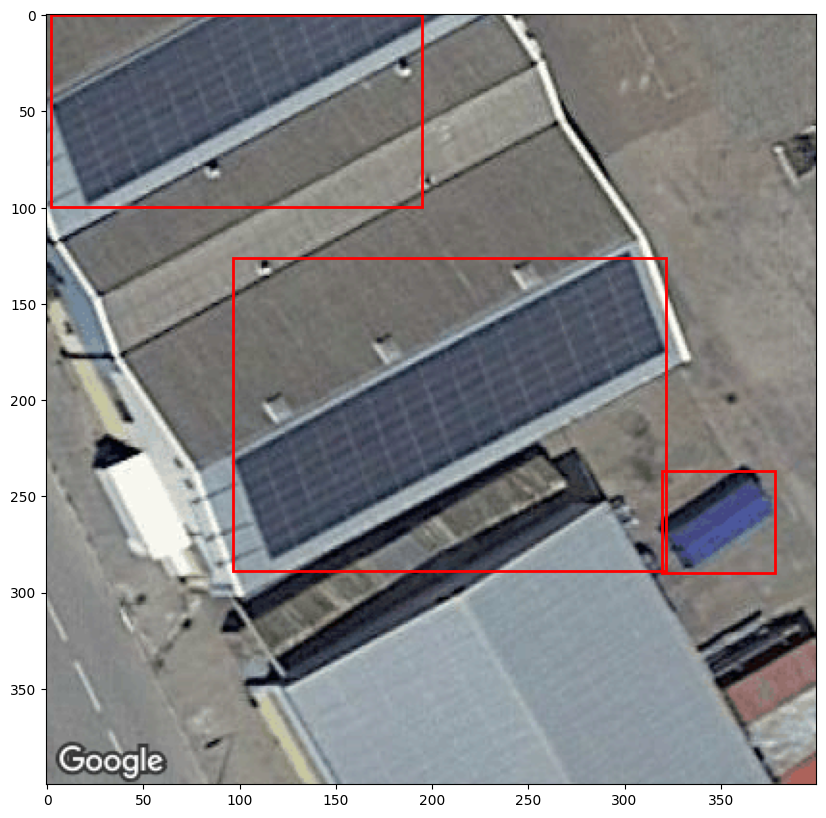

Original Bounding Box(s)


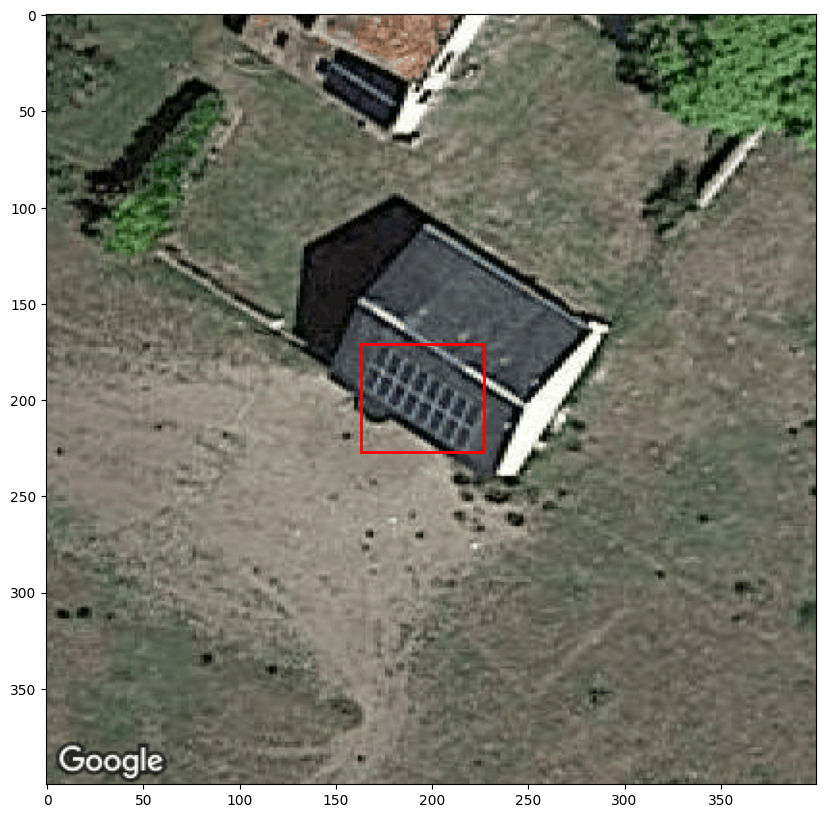

Predicted Bounding Box(s)


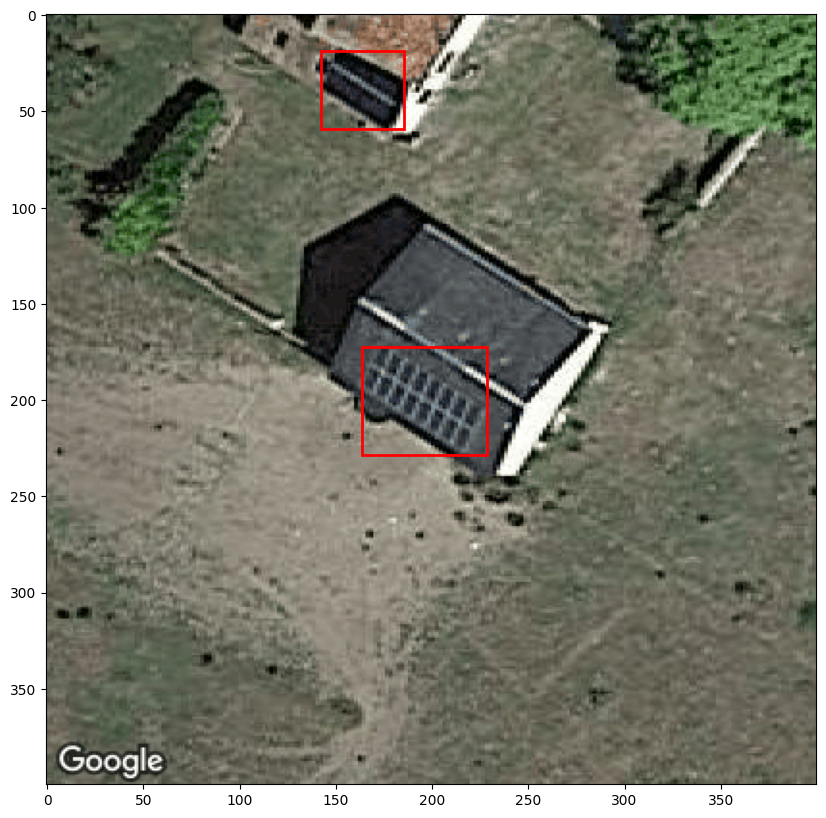

Original Bounding Box(s)


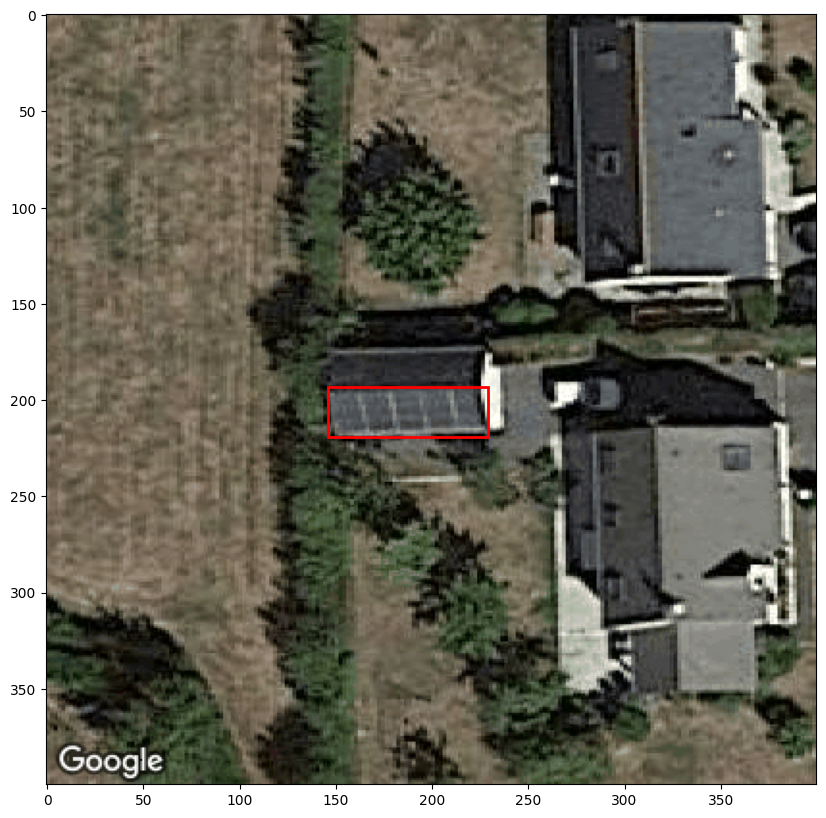

Predicted Bounding Box(s)


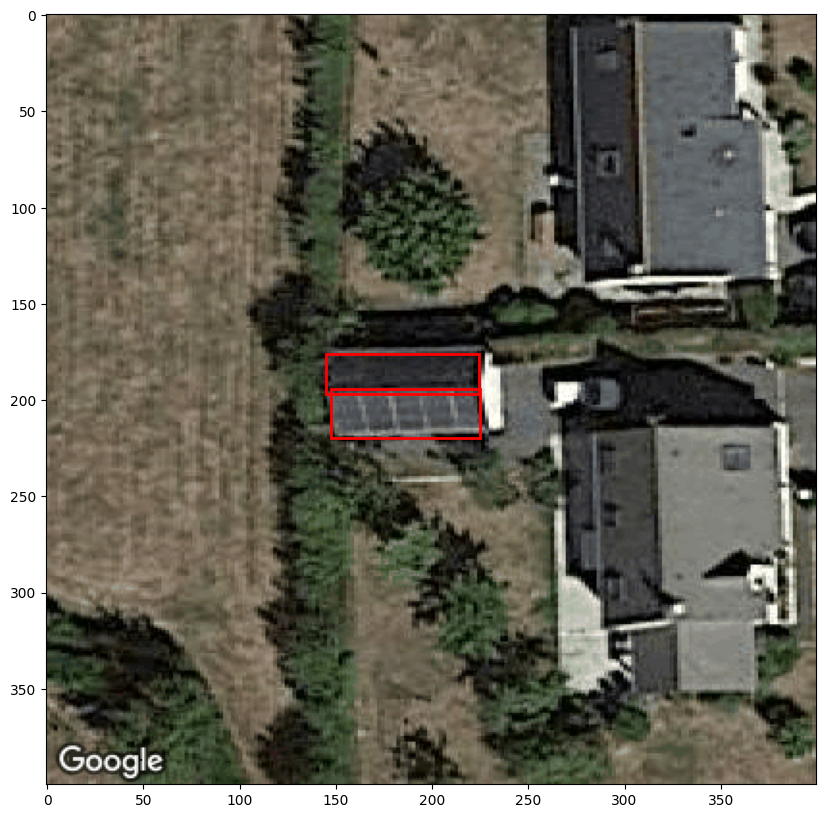

Original Bounding Box(s)


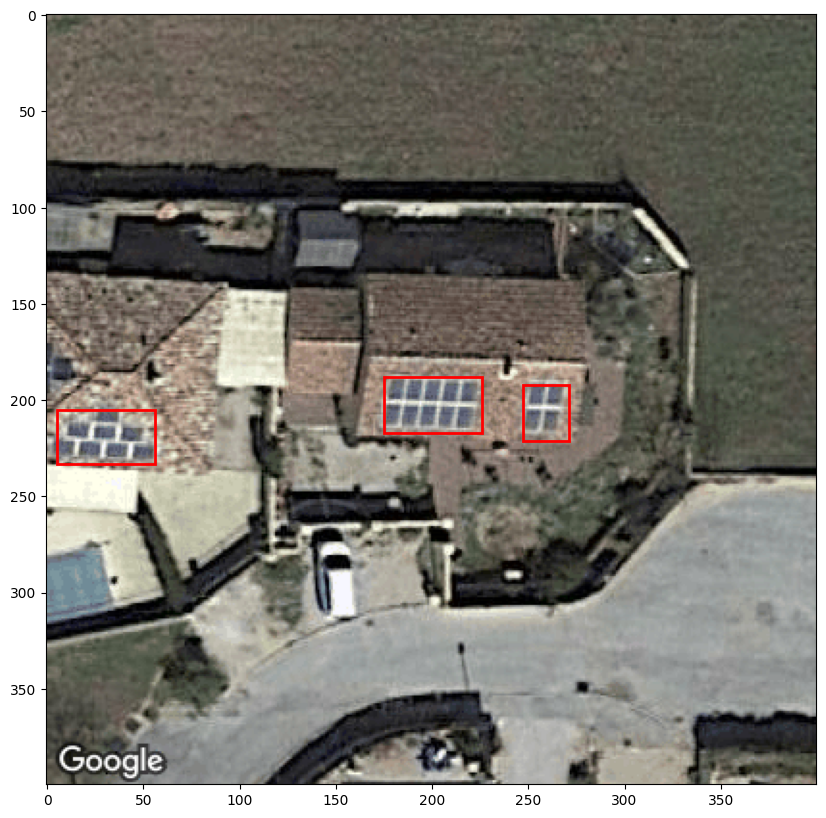

Predicted Bounding Box(s)


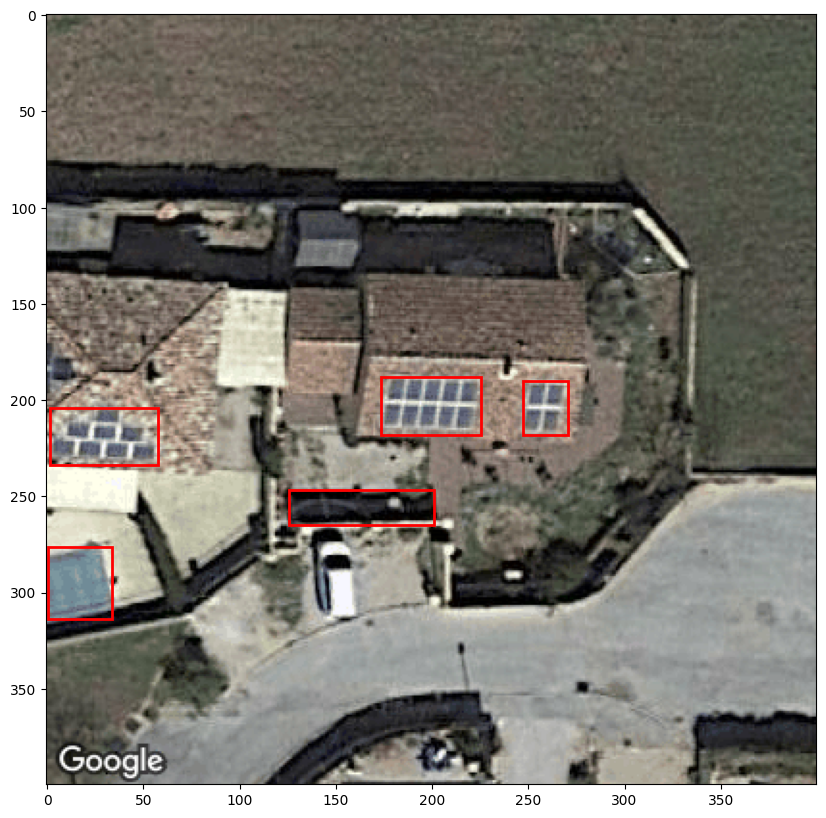

Original Bounding Box(s)


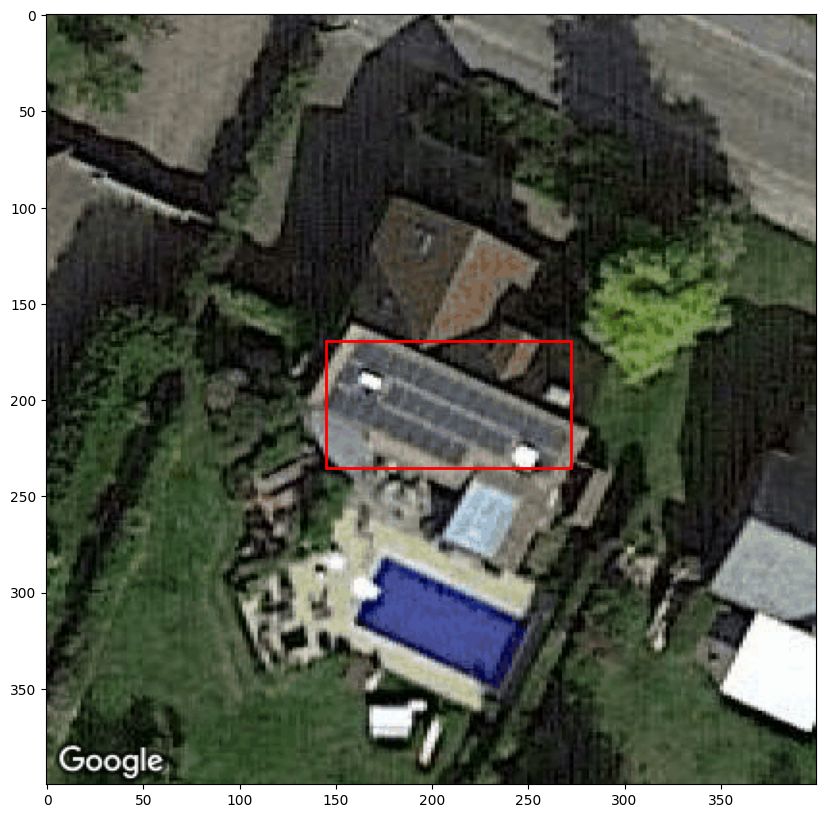

Predicted Bounding Box(s)


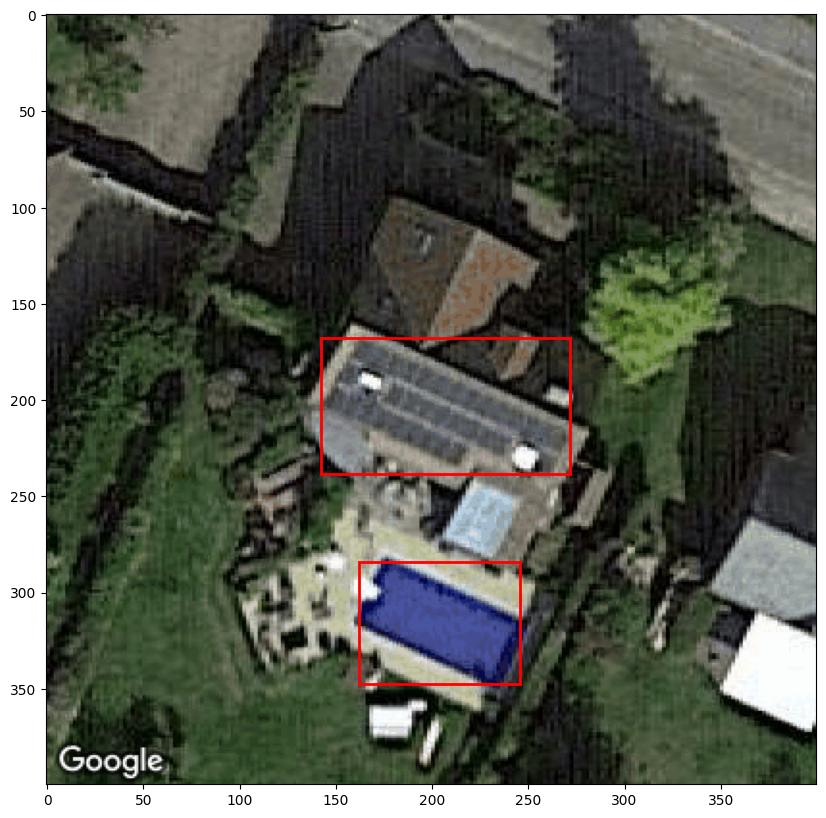

In [43]:
for i in range(6):
  img, target = dataset_test[i]
  model.eval()
  with torch.no_grad():
      prediction = model([img.to(device)])[0]
  nms_prediction = apply_nms(prediction, iou_thresh=0.1)
  print("Original Bounding Box(s)")
  plot_img_bbox(torch_to_pil(img), target)
  print("Predicted Bounding Box(s)")
  plot_img_bbox(torch_to_pil(img), nms_prediction)

In [44]:
torch.save(model, 'bdappvFasterRCNN.pt')

In [45]:
from google.colab import files
files.download('bdappvFasterRCNN.pt') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>